<a href="https://colab.research.google.com/github/Echevarriaj93/DATA6545-MLOPS/blob/main/New!_OFFICIAL_Pipeline_2B_Competition2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

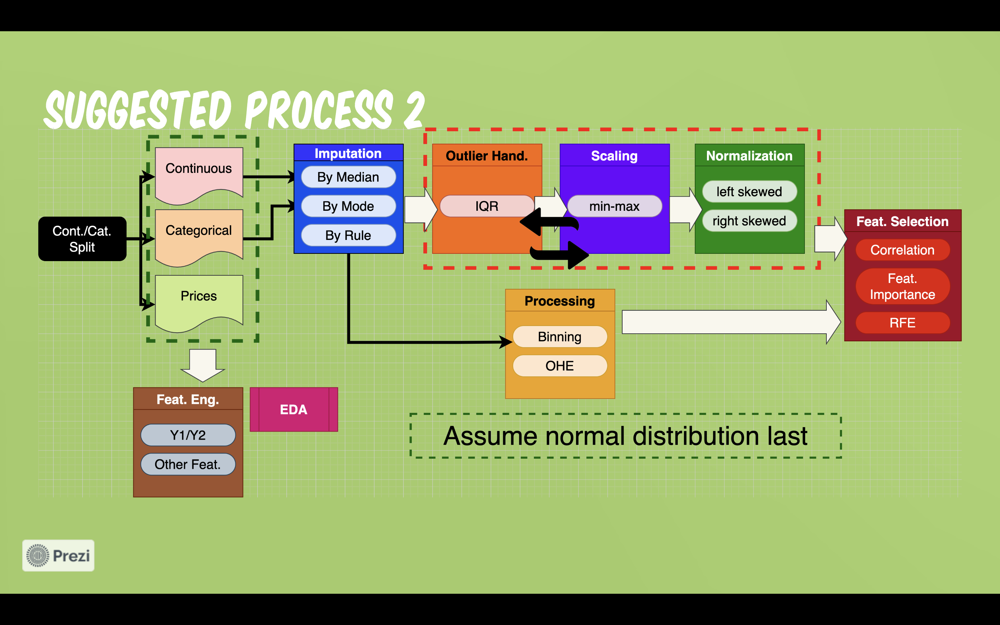

# Importing Dependencies

In [ ]:
#importing dependencies
from sklearn.datasets import make_classification

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import KBinsDiscretizer, FunctionTransformer, PowerTransformer

from sklearn import model_selection

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline

from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, BaggingClassifier, VotingClassifier
from scipy.stats import f_oneway

# balance the data
from imblearn.over_sampling import SMOTE

from scipy.stats import ttest_ind

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
plt.style.use('ggplot')

import datetime
from tqdm import tqdm
from itertools import combinations

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# path = '/content/drive/MyDrive/Classroom/DATA 6545: Data Science and MLOps SP2023/Competition 2/bank_fraud_train.csv'

#Jose
path = '/content/drive/MyDrive/Competition 2/bank_fraud_train.csv'

In [ ]:
bank_df = pd.read_csv(path, index_col = [0], na_values=['-1','...','nan','NaN'])

In [ ]:
bank_df.head()

,fraud_bool,income,name_email_similarity,prev_address_months_count,current_address_months_count,customer_age,days_since_request,intended_balcon_amount,payment_type,zip_count_4w,...,session_length_in_minutes,device_os,keep_alive_session,device_distinct_emails_8w,device_fraud_count,referred,under_loan,canceled_other_cards,default_loan_or_card,month
0,0,0.2,0.773992,NaN,225.0,10.0,0.002405,-0.476980,AB,1200,...,3.529027,macintosh,0.0,1.0,0,not referred,0,no,no,4
1,0,0.6,0.298966,NaN,41.0,20.0,0.023593,-1.324930,AC,1650,...,9.124198,other,1.0,1.0,0,not referred,1,no,no,0
2,1,0.9,0.591834,NaN,60.0,20.0,0.011150,-0.910277,AB,3130,...,11.386064,windows,0.0,1.0,0,not referred,0,no,no,2
3,0,0.1,0.208465,NaN,61.0,40.0,0.008276,-1.113259,AB,1242,...,5.075136,linux,0.0,1.0,0,referred,0,no,no,2
4,0,0.7,0.183629,29.0,13.0,30.0,5.859822,-1.136572,AA,1499,...,5.951549,other,1.0,1.0,0,not referred,0,no,no,3


In [ ]:
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100000 entries, 0 to 99999
Data columns (total 36 columns):
 #   Column                            Non-Null Count   Dtype  
---  ------                            --------------   -----  
 0   fraud_bool                        100000 non-null  int64  
 1   income                            100000 non-null  float64
 2   name_email_similarity             100000 non-null  float64
 3   prev_address_months_count         28753 non-null   float64
 4   current_address_months_count      99576 non-null   float64
 5   customer_age                      97979 non-null   float64
 6   days_since_request                100000 non-null  float64
 7   intended_balcon_amount            100000 non-null  float64
 8   payment_type                      100000 non-null  object 
 9   zip_count_4w                      100000 non-null  int64  
 10  velocity_6h                       100000 non-null  float64
 11  velocity_24h                      100000 non-null  fl

# Data Investigation

<ipython-input-8-cc6cb1362f90>:5: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(7, 4, n+1) #Adjust rows, columns of subplots


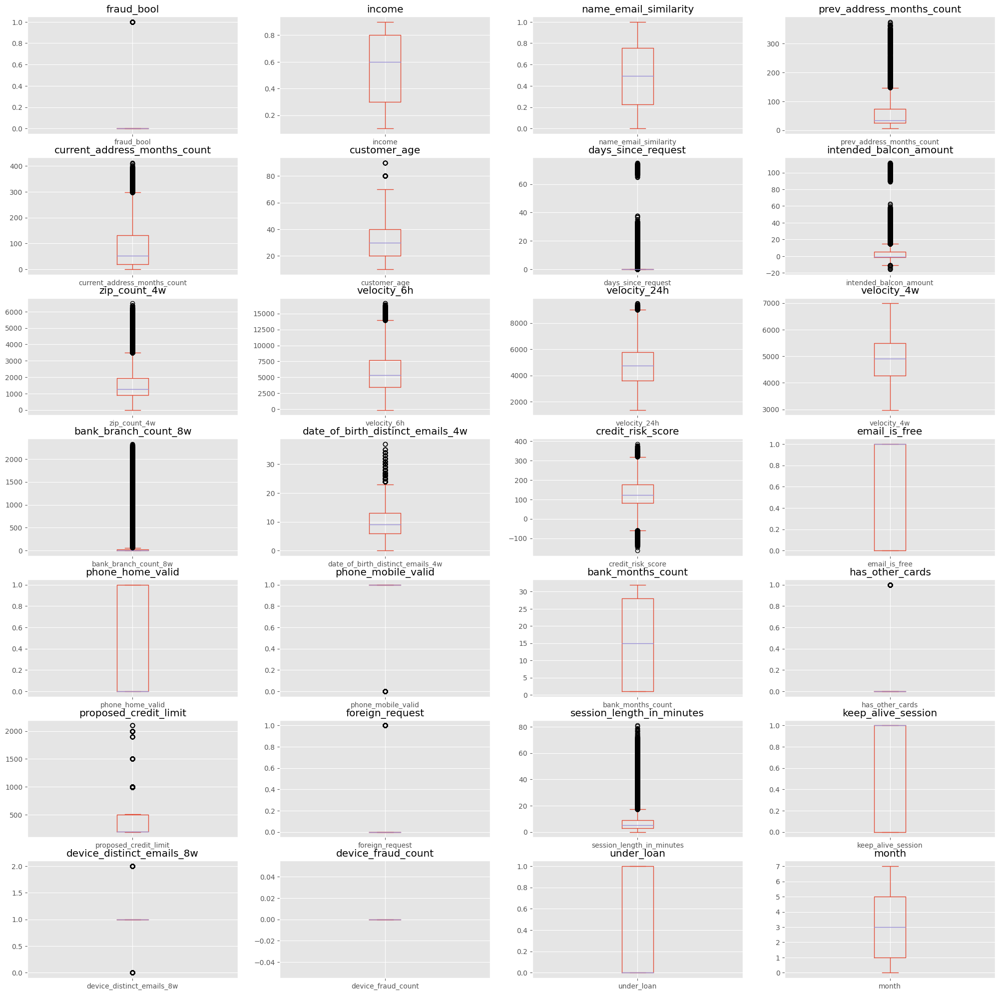

In [ ]:
numeric_data = pd.DataFrame(bank_df._get_numeric_data())

fig, ax = plt.subplots(figsize = (25, 25)) #change size
for n, col in enumerate(numeric_data.columns):
    plt.subplot(7, 4, n+1) #Adjust rows, columns of subplots
    numeric_data[col].plot(ax = plt.gca(), kind='box')
    plt.title(col)
    
plt.show()

As we can see here for the graph of all continuous columns, we need to convert some continuous columns to categorical because they are either binary values or numbers with qualitative context. We will convert those columns to categorical below. 

## Converting some cont_cols to categorical

In [ ]:
convert_cols = ['income','month','fraud_bool','email_is_free','phone_home_valid','phone_mobile_valid',
             'has_other_cards','foreign_request','keep_alive_session','under_loan']

bank_df[convert_cols] = bank_df[convert_cols].astype('category')

In [ ]:
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100000 entries, 0 to 99999
Data columns (total 36 columns):
 #   Column                            Non-Null Count   Dtype   
---  ------                            --------------   -----   
 0   fraud_bool                        100000 non-null  category
 1   income                            100000 non-null  category
 2   name_email_similarity             100000 non-null  float64 
 3   prev_address_months_count         28753 non-null   float64 
 4   current_address_months_count      99576 non-null   float64 
 5   customer_age                      97979 non-null   float64 
 6   days_since_request                100000 non-null  float64 
 7   intended_balcon_amount            100000 non-null  float64 
 8   payment_type                      100000 non-null  object  
 9   zip_count_4w                      100000 non-null  int64   
 10  velocity_6h                       100000 non-null  float64 
 11  velocity_24h                      100000

## Converting `object` columns to `category`

We will also convert columns with `object` datatype into `category` for uniformity

In [ ]:
def convert_obj_to_cat(df):
    obj_cols = df.select_dtypes(include=['object']).columns
    df[obj_cols] = df[obj_cols].astype('category')
    return df

bank_df = convert_obj_to_cat(bank_df)
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100000 entries, 0 to 99999
Data columns (total 36 columns):
 #   Column                            Non-Null Count   Dtype   
---  ------                            --------------   -----   
 0   fraud_bool                        100000 non-null  category
 1   income                            100000 non-null  category
 2   name_email_similarity             100000 non-null  float64 
 3   prev_address_months_count         28753 non-null   float64 
 4   current_address_months_count      99576 non-null   float64 
 5   customer_age                      97979 non-null   float64 
 6   days_since_request                100000 non-null  float64 
 7   intended_balcon_amount            100000 non-null  float64 
 8   payment_type                      100000 non-null  category
 9   zip_count_4w                      100000 non-null  int64   
 10  velocity_6h                       100000 non-null  float64 
 11  velocity_24h                      100000

### Why Keeping Continuous
We decide to keep these columns as continuous(`int64`,`float64`) because of number of reasons:
1. Measures similarity/correlation
2. Measures duration
3. Measures creditworthiness
4. Measures amount

## Dropping `device_fraud_count`
After checking the values of the `device_fraud_count` column, we notice that all of the values are 0 therefore it will not provide any valuable information in the credit card application fraud analysis so we decide to drop it to reduce the data dimension

In [ ]:
bank_df.device_fraud_count.unique() 

array([0])

In [ ]:
bank_df = bank_df.drop('device_fraud_count', axis=1)
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100000 entries, 0 to 99999
Data columns (total 35 columns):
 #   Column                            Non-Null Count   Dtype   
---  ------                            --------------   -----   
 0   fraud_bool                        100000 non-null  category
 1   income                            100000 non-null  category
 2   name_email_similarity             100000 non-null  float64 
 3   prev_address_months_count         28753 non-null   float64 
 4   current_address_months_count      99576 non-null   float64 
 5   customer_age                      97979 non-null   float64 
 6   days_since_request                100000 non-null  float64 
 7   intended_balcon_amount            100000 non-null  float64 
 8   payment_type                      100000 non-null  category
 9   zip_count_4w                      100000 non-null  int64   
 10  velocity_6h                       100000 non-null  float64 
 11  velocity_24h                      100000

# OFFICIAL PREPROCESSING

In [ ]:
cat_cols = bank_df.select_dtypes(include='category').columns.tolist()
bank_df.loc[:,cat_cols] = bank_df.loc[:,cat_cols].astype("category")

In [ ]:
bank_df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
fraud_bool,100000.0,2.0,0.0,98897.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
income,100000.0,9.0,0.9,22096.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
name_email_similarity,100000.0,NaN,NaN,NaN,0.49307,0.288987,0.000019,0.224773,0.491834,0.754533,0.999999
prev_address_months_count,28753.0,NaN,NaN,NaN,61.226098,64.579863,6.0,25.0,34.0,74.0,375.0
current_address_months_count,99576.0,NaN,NaN,NaN,86.993884,88.443449,0.0,20.0,52.0,131.0,413.0
customer_age,97979.0,NaN,NaN,NaN,33.753457,12.043043,10.0,20.0,30.0,40.0,90.0
days_since_request,100000.0,NaN,NaN,NaN,1.020236,5.378612,0.0,0.007186,0.015189,0.026278,75.223008
intended_balcon_amount,100000.0,NaN,NaN,NaN,8.65579,20.235438,-15.530555,-1.181106,-0.829218,5.196816,111.951639
payment_type,100000,5,AB,37031,NaN,NaN,NaN,NaN,NaN,NaN,NaN
zip_count_4w,100000.0,NaN,NaN,NaN,1565.03801,999.471135,2.0,891.0,1258.0,1931.0,6506.0


In [ ]:
cont_cols = [col for col in bank_df.columns if col not in cat_cols]
# cont_cols
bank_cont_df, bank_cat_df = bank_df.loc[:,cont_cols], bank_df.loc[:,cat_cols]


## Skewness

<ipython-input-17-17f9fc8bd751>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  bank_df.skew().plot(kind='bar')


<Axes: >

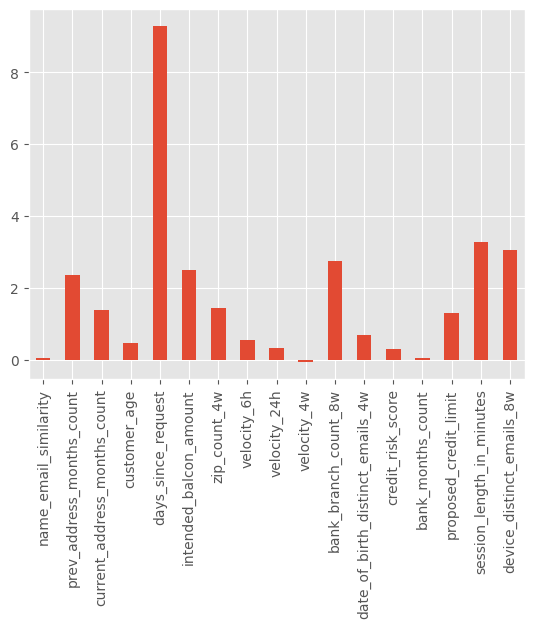

In [ ]:
bank_df.skew().plot(kind='bar')

In [ ]:
bank_df.skew() > .5

<ipython-input-18-3dce5c4b9c68>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  bank_df.skew() > .5


name_email_similarity               False
prev_address_months_count            True
current_address_months_count         True
customer_age                        False
days_since_request                   True
intended_balcon_amount               True
zip_count_4w                         True
velocity_6h                          True
velocity_24h                        False
velocity_4w                         False
bank_branch_count_8w                 True
date_of_birth_distinct_emails_4w     True
credit_risk_score                   False
bank_months_count                   False
proposed_credit_limit                True
session_length_in_minutes            True
device_distinct_emails_8w            True
dtype: bool

Skewness Rule:
*   If skewness is less than -1 or greater than 1, then the distribution is highly skewed
*   If skewness is between -1 and -.5 or between .5 and 1, then the distribution is moderately skewed
*   If skewness is between -.5 and .5, then the distribution approximately symmetric





Here are the columns needed to normalize:

*   `prev_address_months_count`
*   `current_address_months_count`
*   `days_since_request`
*   `intended_balcon_amount`
*   `zip_count_4w`
*   `velocity_6h`
*   `bank_branch_count_8w`
*   `date_of_birth_distinct_emails_4w`
*   `proposed_credit_limit`
*   `device_distinct_emails_8w`



**SKEWNESS REMOVAL NEEDED**

<Axes: >

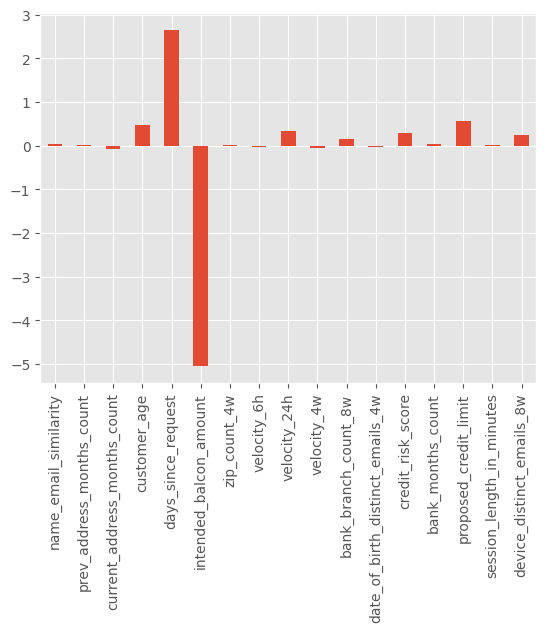

In [ ]:
def remove_skewness(df):
    df_skew = df.loc[:, (df.skew() < -.5) | (df.skew() > .5)]
    names = list(df_skew.columns)
    pt = PowerTransformer()
    df_skew = pd.DataFrame(pt.fit_transform(df_skew), columns=names)
    df[names] = df_skew[names]
    return df

#### TEST CODE
bank_cont_df = remove_skewness(bank_cont_df) 
bank_cont_df.skew().plot(kind='bar')

bank_cont_df.skew().plot(kind='bar')

:The normalization succesfully removed the skewness on all continuous columns but `intended_balcon_amount` and `days_since_request` 

## Outlier Handling and Scaling

<Axes: >

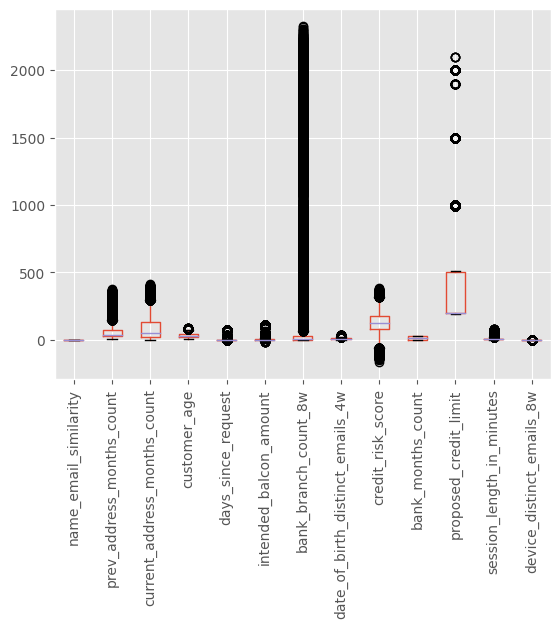

In [ ]:
bank_df.drop(columns=['zip_count_4w','velocity_6h','velocity_24h','velocity_4w']).boxplot(rot=90)


<Axes: >

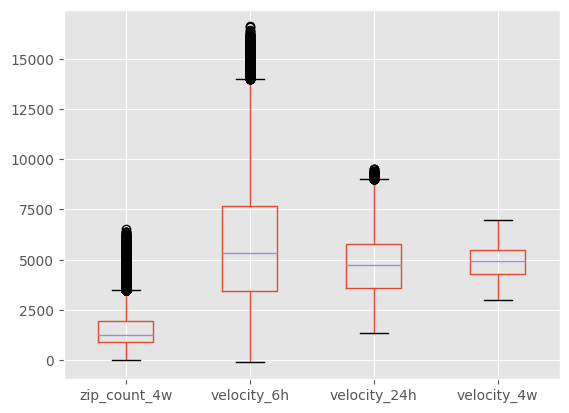

In [ ]:
outscaled = ['zip_count_4w','velocity_6h','velocity_24h','velocity_4w']
bank_df[outscaled].boxplot()



*   **OUTLIER HANDLING NEEDED**
*   **SCALING NEEDED**



In [ ]:
## Handling outliers with x_bar +/- 3*StD
def my_std(col):
    mean = col.mean()
    std = col.std()
    lower_bound = mean - 3 * std
    upper_bound = mean + 3 * std
    col = np.where(col > upper_bound, upper_bound, col)
    col = np.where(col < lower_bound, lower_bound, col)
    return col


<Axes: >

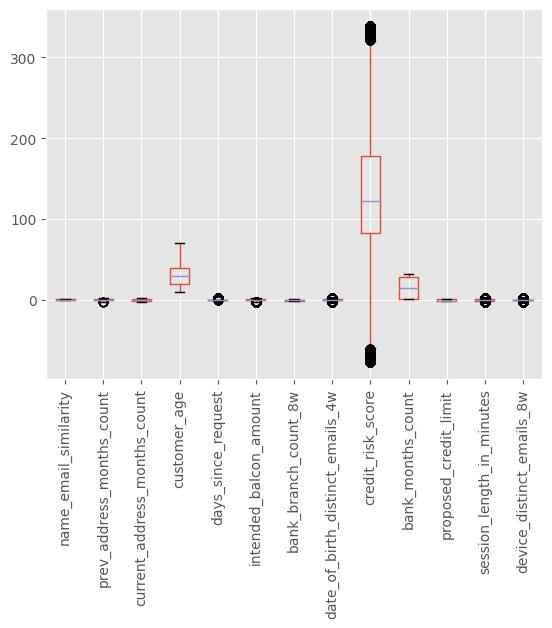

In [ ]:
#### TEST CODE
bank_cont_df2 = bank_cont_df.apply(my_std)
bank_cont_df2.drop(columns=outscaled).boxplot(rot=90)


<Axes: >

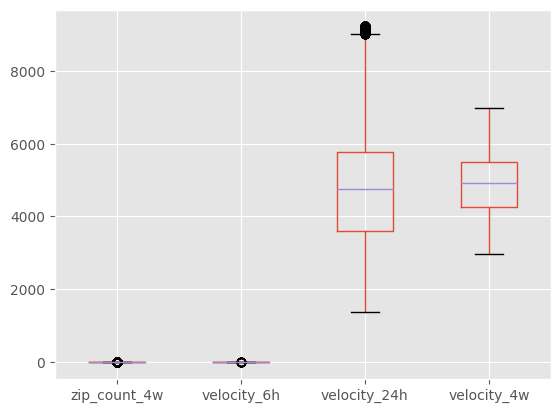

In [ ]:
bank_cont_df2[outscaled].boxplot()

The IQR Outlier Handling method succesfully removed the outlier but we will need to perform Scaling due to the huge values discrepancy

## Checking Null Values

<Axes: >

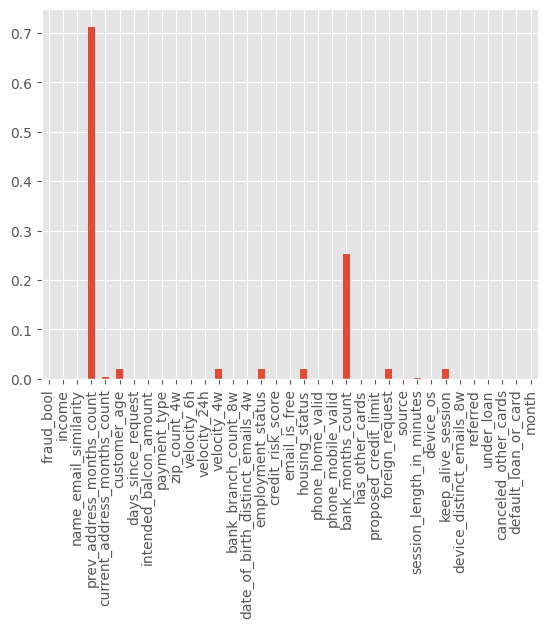

In [ ]:
bank_df.isna().mean().plot(kind='bar')

As we can see, there are columns with null values but this is difficult to see which columns that have null values so we will only plot columns with null values

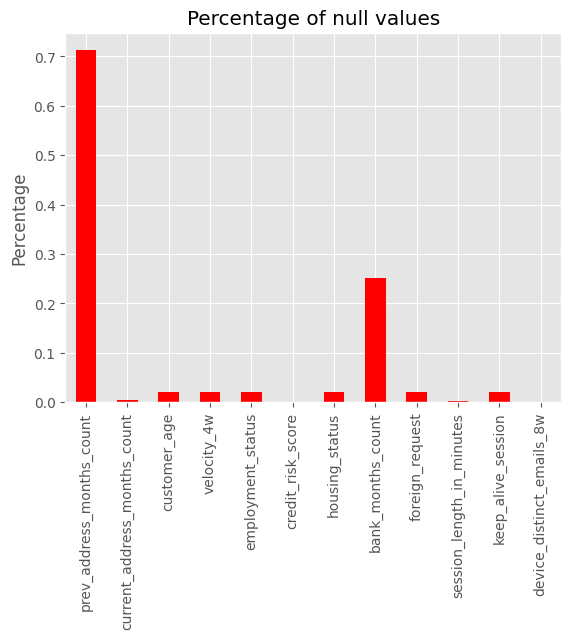

In [ ]:
def plot_null_values(df):
    # Get the columns with null values
    cols_with_nulls = df.columns[df.isnull().any()]

    # Create a dataframe with only the columns with null values
    nulls_df = df.loc[:, cols_with_nulls]

    # Calculate the percentage of null values in each column and plot a bar chart
    nulls_df.isnull().mean().plot(kind='bar', color='r')
    plt.title('Percentage of null values')
    plt.ylabel('Percentage')
    plt.show()

plot_null_values(bank_df)

In [ ]:
print('***The RATIO of missing value:***')
null_cols = bank_df.columns[bank_df.isnull().any()].tolist()
null_percentages = bank_df[null_cols].isna().mean().round(4) * 100
print(null_percentages)


***The RATIO of missing value:***
prev_address_months_count       71.25
current_address_months_count     0.42
customer_age                     2.02
velocity_4w                      2.02
employment_status                2.02
credit_risk_score                0.05
housing_status                   2.02
bank_months_count               25.19
foreign_request                  2.02
session_length_in_minutes        0.22
keep_alive_session               2.02
device_distinct_emails_8w        0.04
dtype: float64


**IMPUTATION NEEDED**

<Axes: >

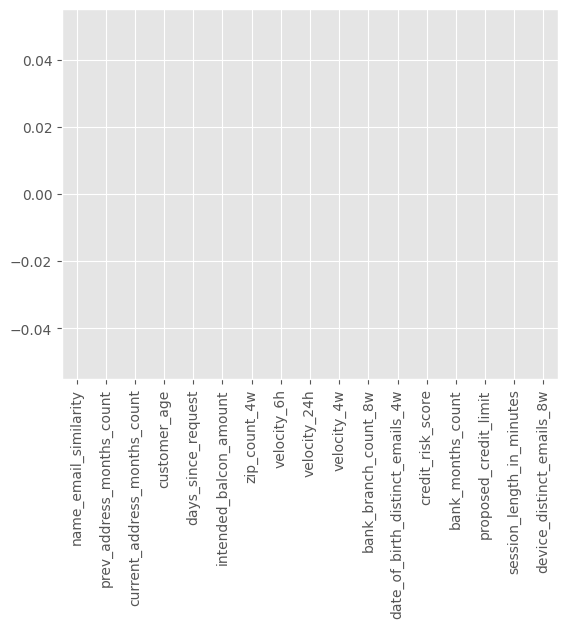

In [ ]:
def fill_null_with_mode(df):
    # Get the columns with null values
    cols_with_nulls = df.columns[df.isnull().any()]

    # Fill null values with the mode of each column
    for col in cols_with_nulls:
        df[col].fillna(df[col].mode()[0], inplace=True)
    
    return df


#### TEST CODE
fill_null_with_mode(bank_cont_df)
bank_cont_df.isna().mean().plot(kind='bar')

The Imputation successfully replaced the null values with the columns' mode

In [ ]:
# !pip install ydata-profiling
# from ydata_profiling import ProfileReport

# profile_eda = ProfileReport(bank_df)

# profile_eda

### Needs rewording on SMOTE

Some features including the target variable are imbalanced and we will perform SMOTE to address the issue. When using SMOTE the number of  examples in the minority class is increased, which can help balance the dataset and improve the performance of the model that may be biased towards the majority class. However, it's important to note that SMOTE can also introduce noise and can lead to overfitting.

/usr/local/lib/python3.9/dist-packages/seaborn/categorical.py:641: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  grouped_vals = vals.groupby(grouper)
/usr/local/lib/python3.9/dist-packages/seaborn/categorical.py:641: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  grouped_vals = vals.groupby(grouper)
/usr/local/lib/python3.9/dist-packages/seaborn/categorical.py:641: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  grouped_vals = vals.groupby(grouper)


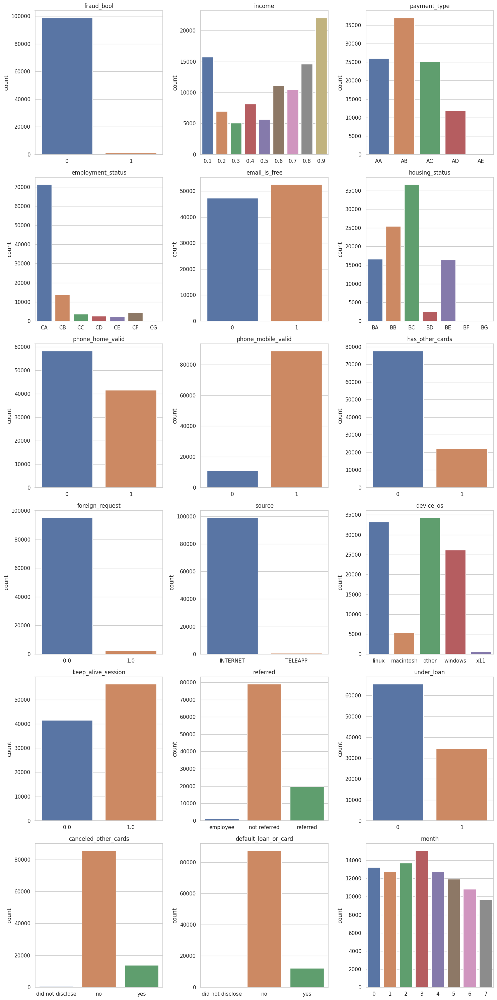

In [ ]:
def plot_countplots(df):
    sns.set(style="whitegrid")
    cat_columns = list(df.select_dtypes(include='category').columns)
    num_columns = len(cat_columns)
    num_rows = int(num_columns/3) + int(num_columns%3 > 0)
    fig, axs = plt.subplots(nrows=num_rows, ncols=3, figsize=(15,5*num_rows))
    fig.subplots_adjust(hspace=0.5)
    axs = axs.ravel()
    for i, column_name in enumerate(cat_columns):
        sns.countplot(ax=axs[i], data=df, x=column_name)
        axs[i].set_title(column_name)
        axs[i].set_xlabel('')
    for j in range(num_columns, num_rows*3):
        fig.delaxes(axs[j])
    plt.tight_layout()
    plt.show()

plot_countplots(bank_df)

In [ ]:
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 100000 entries, 0 to 99999
Data columns (total 35 columns):
 #   Column                            Non-Null Count   Dtype   
---  ------                            --------------   -----   
 0   fraud_bool                        100000 non-null  category
 1   income                            100000 non-null  category
 2   name_email_similarity             100000 non-null  float64 
 3   prev_address_months_count         28753 non-null   float64 
 4   current_address_months_count      99576 non-null   float64 
 5   customer_age                      97979 non-null   float64 
 6   days_since_request                100000 non-null  float64 
 7   intended_balcon_amount            100000 non-null  float64 
 8   payment_type                      100000 non-null  category
 9   zip_count_4w                      100000 non-null  int64   
 10  velocity_6h                       100000 non-null  float64 
 11  velocity_24h                      100000

# Feature Engineering


*   `income_lvl`
*   `age_bins`
*   `prev_address_bool`
*   `age_bin`
*   `bb_count_8w_bool`











In [ ]:
bank_df["bb_count_8w_bool"]= np.where(bank_df["bank_branch_count_8w"]== 0, 0, 1)
bank_df["bb_count_8w_bool"] = bank_df["bb_count_8w_bool"].astype('category')

In [ ]:
bank_df["prev_address_bool"] = np.where(bank_df["prev_address_months_count"].notnull(),1,0)
bank_df["prev_address_bool"] = bank_df["prev_address_bool"].astype('category')

Splitting income into three different income levels can provide a more granular view of credit card application data and help identify potential fraud more effectively:
*   Understand patterns that may indicate fraud from each income level 
*   Different income levels may have different risk profiles therefore by analyzing each income level separately, we can apply different risk assessment models to each level



In [ ]:
# #Creating 3 bins for income groups.

bank_df['income_lvl'] = pd.cut(bank_df['income'], bins = [0, .3, .6, .9], labels=["low", "medium", "high"])

bank_df['income_lvl'] = bank_df['income_lvl'].astype('category')

Knowing the duration of applicants stay in their current address compared to previous can provide several insights in credit card application fraud analysis: 
*   Detecting address manipulation
*   Identity Verification
*   Risk Assessment





In [ ]:
#Fewer bins to categorize age groups

#### 1 = older than 50, 0 = under 50
bank_df['age_bins'] = np.where(bank_df['customer_age'] >= 50.0, 1, 0)

bank_df['age_bins'] = bank_df['age_bins'].astype('category')

In [ ]:
# Define a dictionary to map months to quarters
quarter_dict = {0: 'Q1', 1: 'Q1', 2: 'Q2', 3: 'Q2', 4: 'Q2', 5: 'Q3', 6: 'Q3', 7: 'Q3'}

# Create a new column 'Quarters' based on the values of column 'Month'
bank_df['Quarters'] = bank_df['month'].map(quarter_dict)
bank_df['Quarters'] = bank_df['Quarters'].astype("category")
# Display the DataFrame
bank_df[["month","Quarters"]].sample(10)


,month,Quarters
49331,4,Q2
82598,2,Q2
58955,5,Q3
79990,0,Q1
60853,4,Q2
34265,2,Q2
25616,6,Q3
36372,6,Q3
90530,6,Q3
65900,2,Q2


In [ ]:
bank_df.Quarters.value_counts()

Q2    41560
Q3    32434
Q1    26006
Name: Quarters, dtype: int64

### Dropping Unnecessary Features

In [ ]:
bank_df = bank_df.drop(columns=["customer_age","income","month","prev_address_months_count","velocity_6h","velocity_4w","bank_branch_count_8w"], axis=1)

## Reordering Dataframe based on Datatypes

In [ ]:
def reorder_columns_by_datatype(df):
    continuous_cols = list(df.select_dtypes(include=['int64', 'float64']).columns)
    categorical_cols = list(df.select_dtypes(include=['category']).columns)
    new_cols_order = continuous_cols + categorical_cols
    return df[new_cols_order]

bank_df = reorder_columns_by_datatype(bank_df)
bank_df.head()

,name_email_similarity,current_address_months_count,days_since_request,intended_balcon_amount,zip_count_4w,velocity_24h,date_of_birth_distinct_emails_4w,credit_risk_score,bank_months_count,proposed_credit_limit,...,keep_alive_session,referred,under_loan,canceled_other_cards,default_loan_or_card,bb_count_8w_bool,prev_address_bool,income_lvl,age_bins,Quarters
0,0.773992,225.0,0.002405,-0.476980,1200,5083.620135,7,158.0,10.0,200,...,0.0,not referred,0,no,no,1,0,low,0,Q2
1,0.298966,41.0,0.023593,-1.324930,1650,5964.588829,13,81.0,NaN,200,...,1.0,not referred,1,no,no,0,0,medium,0,Q1
2,0.591834,60.0,0.011150,-0.910277,3130,4973.545088,9,214.0,31.0,1500,...,0.0,not referred,0,no,no,1,0,high,0,Q2
3,0.208465,61.0,0.008276,-1.113259,1242,4426.395355,9,93.0,1.0,200,...,0.0,referred,0,no,no,1,0,low,0,Q2
4,0.183629,13.0,5.859822,-1.136572,1499,3499.793131,21,18.0,28.0,200,...,1.0,not referred,0,no,no,1,1,high,0,Q2


In [ ]:
def move_target_to_last_column(dataframe, target_col):
    cols = list(dataframe.columns)
    cols.remove(target_col)
    new_cols = cols + [target_col]
    return dataframe[new_cols]

bank_df = move_target_to_last_column(bank_df, "fraud_bool")

## Splitting Columns after Feature Engineering

In [ ]:
cat_cols = bank_df.select_dtypes(include='category').columns.tolist()
bank_df.loc[:,cat_cols] = bank_df.loc[:,cat_cols].astype("category")

In [ ]:
cont_cols = [col for col in bank_df.columns if col not in cat_cols]

# Pipeline + ColumnTransformer

In [ ]:
X = bank_df.drop('fraud_bool', axis=1)
y = bank_df['fraud_bool']

In [ ]:
X_cat_cols = X.select_dtypes(include='category').columns.tolist()
X.loc[:,X_cat_cols] = X.loc[:,X_cat_cols].astype("category")

In [ ]:
X_cont_cols = [col for col in X.columns if col not in cat_cols]

In [ ]:
X_cat = X[X_cat_cols]
X_cont = X[X_cont_cols]

In [ ]:
print("X:", X.shape)
print("y:", y.shape)

X: (100000, 32)
y: (100000,)


In [ ]:
X_cols = X.columns
len(X_cols)

32

In [ ]:
## outlier handling function - IQR
def my_iqr(col):
  """outlier handling via the IQR method"""
  ### use np functions to better fit in pipeline
  iqr = 1.5 * (np.quantile(col,.75) - np.quantile(col,.25))
  u_bound = np.quantile(col,.75) + iqr
  l_bound = np.quantile(col,.25) - iqr
  col[col > u_bound], col[col < l_bound] = u_bound, l_bound
  return col

iqr_handler = FunctionTransformer(my_iqr)

In [ ]:
## Handling outliers with x_bar +/- 3*StD
def my_std(col):
    mean = col.mean()
    std = col.std()
    lower_bound = mean - 3 * std
    upper_bound = mean + 3 * std
    col = np.where(col > upper_bound, upper_bound, col)
    col = np.where(col < lower_bound, lower_bound, col)
    return col

std_handler = FunctionTransformer(my_std)

In [ ]:
## Preprocessing pipeline 2B
# Min-Max, IQR, Normalization
cont_preproc = Pipeline([
    ('cat_imputer', SimpleImputer(strategy='most_frequent')),## imputer - no need here but as placeholder
    ("scaler", MinMaxScaler()), ## minmax scaler 
    ('outlier', iqr_handler), ## outlier handling 
    ("skewness", PowerTransformer()), ## skewness removal 
    
])

In [ ]:
ct = ColumnTransformer([
    # (name, transformer, columns)
    # Transformer for categorical variables
     ("onehot", 
          OneHotEncoder(categories='auto', handle_unknown='ignore', ),  
         cat_cols[:-1]),
    # Transformer for continuous variables
    ("cont_preproc",cont_preproc, cont_cols)], 
    # what to do with variables not specified in the indices?
    remainder="drop")

In [ ]:
# apply the preprocessor to the continuous columns in bank_df
X_preprocessed = ct.fit_transform(X)


In [ ]:
transformed_cols = np.concatenate((OneHotEncoder().fit(X_cat).get_feature_names_out(X_cat_cols), X_cont.columns.values))
transformed_cols

array(['payment_type_AA', 'payment_type_AB', 'payment_type_AC',
       'payment_type_AD', 'payment_type_AE', 'employment_status_CA',
       'employment_status_CB', 'employment_status_CC',
       'employment_status_CD', 'employment_status_CE',
       'employment_status_CF', 'employment_status_CG',
       'employment_status_nan', 'email_is_free_0', 'email_is_free_1',
       'housing_status_BA', 'housing_status_BB', 'housing_status_BC',
       'housing_status_BD', 'housing_status_BE', 'housing_status_BF',
       'housing_status_BG', 'housing_status_nan', 'phone_home_valid_0',
       'phone_home_valid_1', 'phone_mobile_valid_0',
       'phone_mobile_valid_1', 'has_other_cards_0', 'has_other_cards_1',
       'foreign_request_0.0', 'foreign_request_1.0',
       'foreign_request_nan', 'source_INTERNET', 'source_TELEAPP',
       'device_os_linux', 'device_os_macintosh', 'device_os_other',
       'device_os_windows', 'device_os_x11', 'keep_alive_session_0.0',
       'keep_alive_session_1.0', 'k

In [ ]:
transformed_df = pd.DataFrame(X_preprocessed, columns=transformed_cols)

In [ ]:
transformed_df.head()

,payment_type_AA,payment_type_AB,payment_type_AC,payment_type_AD,payment_type_AE,employment_status_CA,employment_status_CB,employment_status_CC,employment_status_CD,employment_status_CE,...,days_since_request,intended_balcon_amount,zip_count_4w,velocity_24h,date_of_birth_distinct_emails_4w,credit_risk_score,bank_months_count,proposed_credit_limit,session_length_in_minutes,device_distinct_emails_8w
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,-0.365001,-0.439761,-0.184501,0.281584,-0.410653,0.430443,0.232759,-0.761666,-0.596942,-0.07533
1,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.280905,-0.645327,0.397976,0.836061,0.792335,-0.704621,-0.971030,-0.761666,0.744872,-0.07533
2,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.330065,-0.542515,1.507313,0.208919,0.036145,1.184109,1.410242,1.636739,1.070897,-0.07533
3,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.341511,-0.592284,-0.122775,-0.164530,0.036145,-0.519397,-0.971030,-0.761666,-0.125696,-0.07533
4,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,3.454775,-0.598068,0.220682,-0.848551,1.910116,-1.734356,1.307425,-0.761666,0.102360,-0.07533


## ProfileReport after Transformation

In [ ]:
!pip install ydata-profiling
from ydata_profiling import ProfileReport

profile_eda = ProfileReport(transformed_df)

profile_eda

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.9/345.9 KB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 37.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 65.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 KB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 KB 14.5 MB/s eta 0:00:00
  Attempting uninstall: tqdm
    Found existing installation: tqdm 4.65.0
    Uninstalling tqdm-4.65.0:
      Successfully uninstalled tqdm-4.65.0
  Attempting uninstall: scipy
    Found existing installation: scipy 1.10.1
    Uninstalling scipy-1.10.1:
      Successfully uninstalled scipy-1.10.1
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.1
    Uninstalling matplotlib-3.7.1:
      Successfully uninstalled matplotlib-3.7.1
  Attempting uninstall: vision

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Feature Selection

In [ ]:
features_df = pd.concat([transformed_df,y], axis=1)
features_df.head()

,payment_type_AA,payment_type_AB,payment_type_AC,payment_type_AD,payment_type_AE,employment_status_CA,employment_status_CB,employment_status_CC,employment_status_CD,employment_status_CE,...,intended_balcon_amount,zip_count_4w,velocity_24h,date_of_birth_distinct_emails_4w,credit_risk_score,bank_months_count,proposed_credit_limit,session_length_in_minutes,device_distinct_emails_8w,fraud_bool
0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,-0.439761,-0.184501,0.281584,-0.410653,0.430443,0.232759,-0.761666,-0.596942,-0.07533,0
1,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.645327,0.397976,0.836061,0.792335,-0.704621,-0.971030,-0.761666,0.744872,-0.07533,0
2,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.542515,1.507313,0.208919,0.036145,1.184109,1.410242,1.636739,1.070897,-0.07533,1
3,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.592284,-0.122775,-0.164530,0.036145,-0.519397,-0.971030,-0.761666,-0.125696,-0.07533,0
4,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,-0.598068,0.220682,-0.848551,1.910116,-1.734356,1.307425,-0.761666,0.102360,-0.07533,0


In [ ]:
# define the feature list to select from
feature_lst = list(features_df.iloc[:,:-1].columns)
feature_lst


['payment_type_AA',
 'payment_type_AB',
 'payment_type_AC',
 'payment_type_AD',
 'payment_type_AE',
 'employment_status_CA',
 'employment_status_CB',
 'employment_status_CC',
 'employment_status_CD',
 'employment_status_CE',
 'employment_status_CF',
 'employment_status_CG',
 'employment_status_nan',
 'email_is_free_0',
 'email_is_free_1',
 'housing_status_BA',
 'housing_status_BB',
 'housing_status_BC',
 'housing_status_BD',
 'housing_status_BE',
 'housing_status_BF',
 'housing_status_BG',
 'housing_status_nan',
 'phone_home_valid_0',
 'phone_home_valid_1',
 'phone_mobile_valid_0',
 'phone_mobile_valid_1',
 'has_other_cards_0',
 'has_other_cards_1',
 'foreign_request_0.0',
 'foreign_request_1.0',
 'foreign_request_nan',
 'source_INTERNET',
 'source_TELEAPP',
 'device_os_linux',
 'device_os_macintosh',
 'device_os_other',
 'device_os_windows',
 'device_os_x11',
 'keep_alive_session_0.0',
 'keep_alive_session_1.0',
 'keep_alive_session_nan',
 'referred_employee',
 'referred_not referred'

In [ ]:
len(feature_lst)

77

In [ ]:
# Import the necessary libraries first
#### Correlation method - for classification chi2 only
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_classif
#### RFE method - replace the model with the model you plan to use
from sklearn.feature_selection import RFE
# from sklearn.linear_model import LogisticRegression
#### feature importance method
#### this method can be used for both topK and cut-off
from sklearn.linear_model import Ridge
#### specifically tree-based feature importance method
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
#### for voting
from collections import Counter
#### for ANOVA
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms

In [ ]:
def feature_selector(X, y, model, names, _method="topk", n=int(X.shape[1]/2), fit_X=False, thres = 0.1):
  """voting based feature selector
  - _method: "topk" for top-K method (default), "cutoff" for cut-off based method
  - n: number of features to be selected. only available for top-K method - default half of the total features
  - thres: cut-off threshold (default 0.1), only availabel for cutoff method
  - fit_X: fit_transform X or just return indices
  TODO: include support for regression problems
  """
  #### Placeholder for tests
  # X.shape[0] == y.shape[0]
  if names: # if given feature names
    feature_names = np.array(names)
  else: # otherwise use location
    feature_names = np.array(["X%s" % x for x in range(len(X.shape[0]))])
  if _method == 'topk':
    #### np.argpartition gets the indices of the largest n element from the array in ascending order
    #### [::-1] reverse the order
    ############################################################################
    #### IMPORTANT: 
    #### use `chi2` as the `score_func` when doing categorical features - values has to be non-negative
    #### use `f_classif` as the `score_func` when doing categorical and continuous feautures
    #### use `f_regression` as the `score_func` when doing continuous feautures
    ############################################################################
    corr_features = list(np.argpartition(SelectKBest(score_func=f_classif, k=n).fit(X,y).scores_, -n)[-n:][::-1])
    #### binary masking on features, use np.where() to get the indices of selected
    rfe_features = list(np.where(RFE(model, n_features_to_select=n, step=1).fit(X, y).support_)[0])
    #### argsort get sorted indices by values, ::-1] reverse the asceding order
    ridge_features = list(np.argsort(Ridge(alpha=1.0).fit(X, y).coef_)[-n:][::-1])
    #### using ExtraTree
    extratree_features = list(np.argsort(ExtraTreesClassifier().fit(X, y).feature_importances_)[-n:][::-1])
    ### using Random Forest:
    rf_features = list(np.argsort(RandomForestClassifier().fit(X, y).feature_importances_)[-n:][::-1])
    print("Using the Top-K method: ")
    print("Selected features by correlation: ", feature_names[corr_features])
    print("Selected features by RFE: ", feature_names[rfe_features])
    print("Selected features by Ridge coefficients: ", feature_names[ridge_features])
    print("Selected features by Extra Tree feature importance: ", feature_names[extratree_features])
    print("Selected features by Random Forest feature importance: ", feature_names[rf_features])

  elif _method == 'cutoff':
    corr_features, rfe_features = list(), list() #### N/A
    ridge_features = list(np.where(Ridge(alpha=1.0).fit(X, y).coef_ > thres)[0])
    extratree_features = list(np.where(ExtraTreesClassifier().fit(X, y).feature_importances_ > thres)[0])
    rf_features = list(np.where(RandomForestClassifier().fit(X, y).feature_importances_ > thres)[0])
    print("Using the Cutoff method: ")
    # print("Selected features by correlation: ", feature_names[corr_features])
    # print("Selected features by RFE: ", feature_names[rfe_features])
    print("Selected features by Ridge coefficients: ", feature_names[ridge_features])
    print("Selected features by Extra Tree feature importance: ", feature_names[extratree_features])
    print("Selected features by Random Forest feature importance: ", feature_names[rf_features])
  else:
    return("Only Top-K and Cutoff methods are currently supported!")

  ######################################
  #### combine results using voting ####
  ######################################
  counted = Counter(np.concatenate((corr_features, rfe_features, ridge_features, extratree_features, rf_features), axis=None)).most_common(n)

  #### list of tuples (feature_index, votes)
  counted.sort(key = lambda x: x[1], reverse=True)
  final_select_series = pd.Series({feature_names[f]:c for f,c in counted}).sort_values(ascending=False)
  selected_idx = sorted([f for f,c in counted])
  assert len(selected_idx) == n
  print(final_select_series)
  if fit_X:
    return(X[:,selected_idx])
  else:
    return(feature_names[selected_idx])


In [ ]:
X = features_df.drop('fraud_bool', axis = 1)
y = features_df['fraud_bool']

In [ ]:
len(feature_lst)

77

In [ ]:
X.shape, y.shape

((100000, 77), (100000,))

In [ ]:
feature_selector(X, y, model=RandomForestClassifier(), names=feature_lst, n=33)

Using the Top-K method: 
Selected features by correlation:  ['device_distinct_emails_8w' 'payment_type_AC' 'proposed_credit_limit'
 'housing_status_BA' 'credit_risk_score'
 'date_of_birth_distinct_emails_4w' 'housing_status_BB'
 'housing_status_BC' 'housing_status_BE' 'phone_home_valid_0'
 'current_address_months_count' 'name_email_similarity'
 'phone_home_valid_1' 'device_os_linux' 'device_os_other' 'age_bins_1'
 'age_bins_0' 'device_os_windows' 'keep_alive_session_0.0'
 'income_lvl_high' 'prev_address_bool_1' 'prev_address_bool_0'
 'keep_alive_session_1.0' 'payment_type_AA' 'intended_balcon_amount'
 'bb_count_8w_bool_1' 'has_other_cards_1' 'has_other_cards_0'
 'email_is_free_1' 'email_is_free_0' 'bb_count_8w_bool_0' 'income_lvl_low'
 'employment_status_CC']
Selected features by RFE:  ['payment_type_AB' 'payment_type_AC' 'employment_status_CA'
 'email_is_free_1' 'housing_status_BA' 'phone_home_valid_0'
 'phone_mobile_valid_0' 'device_os_windows' 'keep_alive_session_0.0'
 'referred_not

array(['payment_type_AB', 'payment_type_AC', 'employment_status_CA',
       'email_is_free_0', 'email_is_free_1', 'housing_status_BA',
       'phone_home_valid_0', 'device_os_windows',
       'keep_alive_session_0.0', 'referred_not referred',
       'referred_referred', 'under_loan_0', 'under_loan_1',
       'default_loan_or_card_yes', 'bb_count_8w_bool_0',
       'bb_count_8w_bool_1', 'income_lvl_high', 'age_bins_0',
       'age_bins_1', 'Quarters_Q1', 'Quarters_Q2', 'Quarters_Q3',
       'name_email_similarity', 'current_address_months_count',
       'days_since_request', 'intended_balcon_amount', 'zip_count_4w',
       'velocity_24h', 'date_of_birth_distinct_emails_4w',
       'credit_risk_score', 'bank_months_count', 'proposed_credit_limit',
       'device_distinct_emails_8w'], dtype='<U37')

In [ ]:
# out_path = '/content/drive/MyDrive/Classroom/DATA 6545: Data Science and MLOps SP2023/Competition 2/Validation/2B_Comp2_data.csv'


# out_path = '/content/drive/MyDrive/Competition 2/Validation/2B_Comp2_data.csv'
# features_df.to_csv(out_path)
